# **MicroProyecto: Pronóstico de Ventas para una máquina expendedora de café**
>### **Curso:** Proyecto_Desarrollo de Soluciones

>### **EDA** 

>#### **Presentado por:** Team 4


### **Descripción del Proyecto**

Este proyecto desarrollará un sistema ligero de pronóstico de ventas para una máquina expendedora de café como producto basado en datos. El sistema utilizará análisis histórico transaccional para predecir la demanda a corto plazo (1-7 días), permitiendo optimizar las decisiones de reposición y disponibilidad de productos.

El producto final será un prototipo funcional que combine análisis descriptivo de patrones de consumo con un modelo predictivo de aprendizaje supervisado, implementado a través de un tablero interactivo que proporcione insights operativos para la gestión de la máquina expendedora.

### **Problema y contexto**

>#### Contexto 

El conjunto de datos reales que recopila 3.636 transacciones registradas por una máquina expendedora de café desde 01 de marzo de 2024 hasta 23 de marzo del 2025. Cada fila representa una venta, incluyendo la fecha y hora, tipo de café vendido, valor pagado, método de pago (efectivo o tarjeta). Proviene de una base de datos pública, alojada en los “datasets” de Kaggle.com y su contexto es de una máquina ubicada en Vinnytsia(Ucrania) dentro de un centro comercial. 
El análisis de estos datos permitirá entender los patrones de consumo por día, hora y método de pago, y establecer modelos predictivos para anticipar la demanda futura. Esto es útil para optimizar inventario, logística, horarios de mantenimiento y hasta diseño de promociones. 


>#### Problema
No existe una visión consolidada y accionable para: 
-	Entender qué productos y rangos de precio impulsan el volumen y los ingresos.
-	Detectar patrones temporales y por método de pago que permitan planificar stock y promociones.
-	Anticipar la demanda futura a corto plazo para mejorar reposición y disponibilidad.


### **Pregunta de Negocio y Alcance del proyecto** 

>"¿Cuáles son los patrones de demanda por producto, hora y método de pago que nos permitan pronosticar ventas a corto plazo (1-7 días) y optimizar la reposición de la máquina expendedora?"


### **Alcance**

El proyecto desarrollará un sistema ligero de pronóstico de ventas diarias (horizonte 1–7 días) para una máquina expendedora de café, apoyado en el análisis de patrones históricos de consumo por producto, hora y método de pago. Incluirá un prototipo de modelo supervisado entrenado y validado con métricas como MAE, MAPE y RMSE, así como un pipeline automatizado de preprocesamiento y división de datos (80 % entrenamiento, 10 % validación, 10 % prueba). Como resultado, se entregará un dashboard interactivo que combine visualizaciones de ventas pasadas y predicciones, alertas automáticas para productos de alta demanda y recomendaciones de reposición basadas en la velocidad de venta histórica.

### **Descripción del Conjunto de Datos**

### **Información General del Dataset**

>#### Origen y Contexto

- Fuente: Dataset público disponible en Kaggle.com
- Ubicación Geográfica: Vinnytsia, Ucrania
- Localización Específica: Centro comercial en Vinnytsia
- Zona Horaria: Europe/Kiev (UTC+2/UTC+3 según DST)
- Tipo de Negocio: Máquina expendedora automatizada de bebidas de café

>#### Características Técnicas del Dataset

- Formato: CSV (Comma-Separated Values)
- Archivo: index_1.csv
- Tamaño: 3,636 registros × 6 columnas
- Período de Datos: Del 1 de marzo de 2024 al 23 de marzo de 2025
- Duración Total: 387 días de operación
- Frecuencia de Actualización: Transaccional (tiempo real por venta)

### **Descripción Detallada de Variables**

>**1.date**
- Tipo: Categórico (fecha en formato texto)
- Formato: YYYY-MM-DD
- Rango: 2024-03-01 a 2025-03-23
- Propósito: Identificador de día para análisis temporal diario
- Calidad: Sin valores nulos, 381 días únicos

>**2.datetime**
- Tipo: Temporal (timestamp completo)
- Formato: YYYY-MM-DD HH:MM:SS.milliseconds
- Precisión: Microsegundos
- Zona Horaria: Europe/Kiev (ajustada automáticamente)
- Propósito: Timestamp exacto de cada transacción para análisis granular
- Calidad: Sin valores nulos, 3,636 timestamps únicos

>**3.cash_type**
- Tipo: Categórico (método de pago)
- Valores: "card" (tarjeta), "cash" (efectivo)
- Distribución: Predominantemente transacciones con tarjeta
- Propósito: Análisis de preferencias de pago y gestión de efectivo
- Calidad: Sin valores nulos

>**4.card**
- Tipo: Categórico (identificador anonimizado)
- Formato: "ANON-0000-0000-XXXX"
- Valores Nulos: 89 registros (2.45% del total)
- Propósito: Identificación de clientes recurrentes (anonimizada por privacidad)

Nota: Los valores nulos corresponden a transacciones en efectivo

>**5.money**
- Tipo: Numérico (continuo)
- Unidad: UAH (Grivna Ucraniana)
- Rango: 23.02 - 796.00 UAH por transacción
- Media: 31.75 UAH por transacción
- Mediana: 32.82 UAH por transacción
- Propósito: Análisis de revenue, pricing y patrones de gasto
- Calidad: Sin valores nulos, sin valores negativos

>**6.coffee_name**
- Tipo: Categórico (producto)
- Valores Únicos: 8 productos diferentes
- Productos: 
- Latte
- Americano
- Cappuccino
- Espresso
- Hot Chocolate
- Cortado
- Americano with Milk
- Cocoa

**Propósito:** Análisis de portfolio de productos y preferencias del consumidor.

>**El dataset se encuentra:** vinculado al repositorio en GitHub y será gestionado con DVC, utilizando S3 de AWS como almacenamiento remoto para su versionado y control de cambios. 


### **Exploración de los Datos**

### 0. Imports organizados por categoría

-	¿Por qué?: Organización modular de dependencias para análisis de datos completo
-	¿Qué muestra?: Estructura profesional con librerías para manipulación, visualización, estadísticas y ML
-	Decisiones: Usar colores corporativos personalizados, desactivar warnings, configurar pandas
-	¿Cuándo?: Al inicio del proyecto para establecer el ambiente de trabajo

In [1]:
import pandas as pd
import numpy as np
import os
from pathlib import Path
import logging
from typing import Dict, List, Optional
import warnings
import sys

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Análisis estadístico
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Machine Learning
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')
pd.set_option("display.max_columns", 100)
pd.set_option("display.float_format", '{:.2f}'.format)

# Configuración de colores corporativos
COLORS = {
    'primary': '#2E4057',
    'secondary': '#048A81',
    'accent': '#F39C12',
    'warning': '#E74C3C',
    'success': '#27AE60'
}

### 1. Configuración avanzada con gestión de errores


- ¿Por qué?: Crear sistema robusto de gestión de archivos y logging
- ¿Qué muestra?: Paths dinámicos, creación automática de directorios, configuración de timezone
- Decisiones: Usar pathlib, timezone de Kiev, estructura de carpetas organizada
- ¿Cuándo?: Después de imports, antes de cargar datos

In [2]:
# Configuración de logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Configuración de rutas 
# si el notebook está en la misma ubicación en la que se tienen los archivos
current_dir = Path.cwd()
CONFIG = {
    'RAW_CSV_PATH': current_dir / "index_1.csv",  # Archivo en directorio actual
    'EXTERNAL_DATA_PATH': current_dir / "data" / "external",
    'PROCESSED_DATA_PATH': current_dir / "data" / "processed",
    'FIGURES_PATH': current_dir / "figures",
    'TIMEZONE': 'Europe/Kiev',
}

# Crear directorios si no existen
for path in [CONFIG['PROCESSED_DATA_PATH'], CONFIG['FIGURES_PATH'], CONFIG['EXTERNAL_DATA_PATH']]:
    path.mkdir(parents=True, exist_ok=True)

print("Configuración de rutas:")
for key, value in CONFIG.items():
    print(f"{key}: {value}")

Configuración de rutas:
RAW_CSV_PATH: C:\Users\durle\Downloads\MAIA - BC1 - Software Lab\Micro P _DS\N1\index_1.csv
EXTERNAL_DATA_PATH: C:\Users\durle\Downloads\MAIA - BC1 - Software Lab\Micro P _DS\N1\data\external
PROCESSED_DATA_PATH: C:\Users\durle\Downloads\MAIA - BC1 - Software Lab\Micro P _DS\N1\data\processed
FIGURES_PATH: C:\Users\durle\Downloads\MAIA - BC1 - Software Lab\Micro P _DS\N1\figures
TIMEZONE: Europe/Kiev


### 2. Carga y validación robusta de los datos 

- ¿Por qué?: Garantizar integridad de datos desde el inicio
- ¿Qué muestra?: Búsqueda inteligente de archivos, validaciones múltiples, reporte de calidad
- Decisiones: Búsqueda en múltiples ubicaciones, validar columnas críticas
- ¿Cuándo?: Primera operación crítica del pipeline de datos

In [3]:
def load_and_validate_data(csv_path: Path) -> pd.DataFrame:
    """Carga y validación de datos con manejo robusto de errores y búsqueda inteligente"""
    
    try:
        # Verificar existencia del archivo en la ruta especificada
        if not csv_path.exists():
            logger.warning(f"Archivo no encontrado en ruta especificada: {csv_path}")
            
            # Búsqueda alternativa en ubicaciones comunes
            alternative_paths = [
                csv_path,  # Ruta original
                Path("index_1.csv"),  # En directorio actual
                Path("../index_1.csv"),  # Un nivel arriba
                Path("data/index_1.csv"),  # En subcarpeta data
                Path("../data/index_1.csv"),  # data un nivel arriba
            ]
            
            found_path = None
            for alt_path in alternative_paths:
                if alt_path.exists():
                    found_path = alt_path
                    logger.info(f"Archivo encontrado en: {found_path.resolve()}")
                    break
            
            if found_path is None:
                # Listar archivos CSV disponibles para ayudar al usuario
                csv_files = list(Path('.').rglob('*.csv'))
                if csv_files:
                    logger.info("Archivos CSV disponibles:")
                    for csv_file in csv_files:
                        logger.info(f"  {csv_file}")
                    raise FileNotFoundError(f"No se encontró index_1.csv. Archivos CSV disponibles: {[f.name for f in csv_files]}")
                else:
                    raise FileNotFoundError("No se encontraron archivos CSV en el proyecto")
            
            csv_path = found_path
        
        # Cargar datos
        logger.info(f"Cargando datos desde: {csv_path.resolve()}")
        df_raw = pd.read_csv(csv_path, encoding='utf-8')
        logger.info(f"Datos cargados exitosamente. Shape: {df_raw.shape}")

        # Validaciones básicas
        required_cols = ['datetime', 'money', 'coffee_name']
        validations = {
            'empty_dataframe': len(df_raw) == 0,
            'missing_required_cols': not all(col in df_raw.columns for col in required_cols),
            'all_null_money': df_raw['money'].isna().all() if 'money' in df_raw.columns else True,
            'negative_amounts': (df_raw['money'] < 0).any() if 'money' in df_raw.columns else False,
        }

        failed_validations = [k for k, v in validations.items() if v]
        if failed_validations:
            raise ValueError(f"Validaciones fallidas: {failed_validations}. Columnas disponibles: {list(df_raw.columns)}")

        return df_raw

    except Exception as e:
        logger.error(f"Error cargando datos: {str(e)}")
        raise

# Ejecutar carga con manejo mejorado
try:
    df_raw = load_and_validate_data(CONFIG['RAW_CSV_PATH'])
    
    # Reporte de calidad inicial
    quality_report = {
        'total_records': len(df_raw),
        'date_range': f"{df_raw['date'].min()} to {df_raw['date'].max()}" if 'date' in df_raw.columns else 'N/A',
        'unique_products': df_raw['coffee_name'].nunique() if 'coffee_name' in df_raw.columns else 'N/A',
        'missing_values': df_raw.isnull().sum().to_dict(),
        'duplicate_records': df_raw.duplicated().sum(),
        'data_types': df_raw.dtypes.to_dict()
    }

    print("=== REPORTE DE CALIDAD DE DATOS ===")
    for key, value in quality_report.items():
        print(f"{key}: {value}")
        
except FileNotFoundError as e:
    print(f"Error: {e}")
    print("\nPor favor, asegúrate de que:")
    print("1. El archivo index_1.csv existe en el proyecto")
    print("2. O coloca el archivo en una de estas ubicaciones:")
    print("   - Mismo directorio que tu notebook")
    print("   - En una carpeta 'data' en el directorio actual")
    print("   - En una carpeta 'data' un nivel arriba")
    print("\nSi el archivo tiene otro nombre, renómbralo a 'index_1.csv' o actualiza la configuración")

INFO:__main__:Cargando datos desde: C:\Users\durle\Downloads\MAIA - BC1 - Software Lab\Micro P _DS\N1\index_1.csv
INFO:__main__:Datos cargados exitosamente. Shape: (3636, 6)


=== REPORTE DE CALIDAD DE DATOS ===
total_records: 3636
date_range: 2024-03-01 to 2025-03-23
unique_products: 8
missing_values: {'date': 0, 'datetime': 0, 'cash_type': 0, 'card': 89, 'money': 0, 'coffee_name': 0}
duplicate_records: 0
data_types: {'date': dtype('O'), 'datetime': dtype('O'), 'cash_type': dtype('O'), 'card': dtype('O'), 'money': dtype('float64'), 'coffee_name': dtype('O')}


### 2.1 Visualización de los Datos 

In [4]:
if 'df_raw' in locals() and df_raw is not None:
    print("\n" + "="*50)
    print("INFORMACIÓN DEL DATASET")
    print("="*50)
    print(f"Shape del DataFrame: {df_raw.shape}")
    print(f"Rows: {df_raw.shape[0]:,}")
    print(f"Columns: {df_raw.shape[1]}")
    print(f"Available columns: {list(df_raw.columns)}")
    print("="*50)
else:
    print("No hay datos cargados para mostrar el shape")


INFORMACIÓN DEL DATASET
Shape del DataFrame: (3636, 6)
Rows: 3,636
Columns: 6
Available columns: ['date', 'datetime', 'cash_type', 'card', 'money', 'coffee_name']


In [5]:
display(df_raw.head())

,date,datetime,cash_type,card,money,coffee_name
0,2024-03-01,2024-03-01 10:15:50.520,card,ANON-0000-0000-0001,38.70,Latte
1,2024-03-01,2024-03-01 12:19:22.539,card,ANON-0000-0000-0002,38.70,Hot Chocolate
2,2024-03-01,2024-03-01 12:20:18.089,card,ANON-0000-0000-0002,38.70,Hot Chocolate
3,2024-03-01,2024-03-01 13:46:33.006,card,ANON-0000-0000-0003,28.90,Americano
4,2024-03-01,2024-03-01 13:48:14.626,card,ANON-0000-0000-0004,38.70,Latte


### 3. Análisis de outliers avanzado

- ¿Por qué?: Identificar anomalías que pueden afectar el análisis
- ¿Qué muestra?: Múltiples métodos (IQR, Z-score, percentiles), visualizaciones estadísticas
- Decisiones: Usar tres métodos diferentes para robustez, análisis temporal de outliers
- ¿Cuándo?: Después de cargar datos, antes de limpieza

Tipo de dato de datetime antes de conversión: object
Primeras 5 fechas: ['2024-03-01 10:15:50.520', '2024-03-01 12:19:22.539', '2024-03-01 12:20:18.089', '2024-03-01 13:46:33.006', '2024-03-01 13:48:14.626']
Tipo de dato de datetime después de conversión: datetime64[ns, UTC]
Valores nulos después de conversión: 0


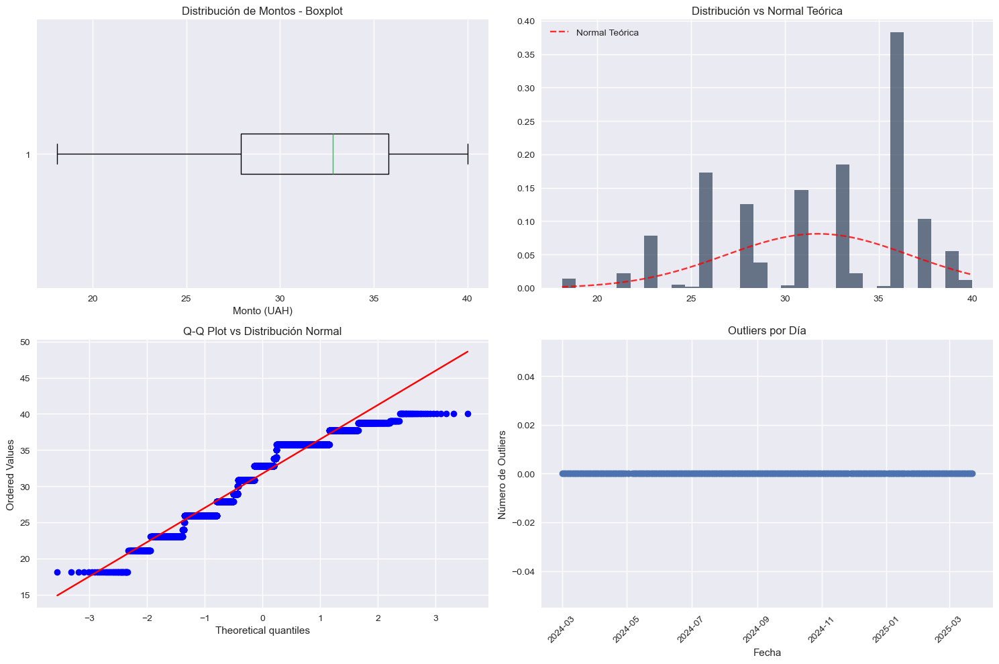

=== ANÁLISIS DE OUTLIERS ===
distribution_stats: {'mean': 31.74685918591859, 'median': 32.82, 'std': 4.919925803555333, 'skewness': -0.5230376598963778, 'kurtosis': -0.6611431671294365, 'coefficient_variation': 0.15497362352423133}
iqr_outliers_count: 0
zscore_outliers_count: 0
percentile_outliers_count: 273


In [6]:
def comprehensive_outlier_analysis(df: pd.DataFrame) -> Dict:
    """Análisis comprehensivo de outliers con múltiples métodos"""

    money_col = df['money'].dropna()

    # Método 1: IQR
    Q1, Q3 = money_col.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    iqr_outliers = money_col[(money_col < Q1 - 1.5*IQR) | (money_col > Q3 + 1.5*IQR)]

    # Método 2: Z-Score
    z_scores = np.abs(stats.zscore(money_col))
    zscore_outliers = money_col[z_scores > 3]

    # Método 3: Percentiles
    p95 = money_col.quantile(0.95)
    p05 = money_col.quantile(0.05)
    percentile_outliers = money_col[(money_col > p95) | (money_col < p05)]

    # Análisis de distribución
    distribution_stats = {
        'mean': money_col.mean(),
        'median': money_col.median(),
        'std': money_col.std(),
        'skewness': stats.skew(money_col),
        'kurtosis': stats.kurtosis(money_col),
        'coefficient_variation': money_col.std() / money_col.mean()
    }

    # Visualización mejorada
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Boxplot
    axes[0,0].boxplot(money_col, vert=False)
    axes[0,0].set_title('Distribución de Montos - Boxplot')
    axes[0,0].set_xlabel('Monto (UAH)')

    # Histograma con curva normal
    axes[0,1].hist(money_col, bins=30, density=True, alpha=0.7, color=COLORS['primary'])
    mu, sigma = money_col.mean(), money_col.std()
    x = np.linspace(money_col.min(), money_col.max(), 100)
    axes[0,1].plot(x, stats.norm.pdf(x, mu, sigma), 'r--', alpha=0.8, label='Normal Teórica')
    axes[0,1].set_title('Distribución vs Normal Teórica')
    axes[0,1].legend()

    # Q-Q Plot
    stats.probplot(money_col, dist="norm", plot=axes[1,0])
    axes[1,0].set_title('Q-Q Plot vs Distribución Normal')

    # Análisis temporal de outliers 
    df_temp = df.copy()
    
    # DIAGNÓSTICO: Verificar el tipo de dato actual
    print(f"Tipo de dato de datetime antes de conversión: {df_temp['datetime'].dtype}")
    print(f"Primeras 5 fechas: {df_temp['datetime'].head().tolist()}")
    
    # CONVERSIÓN ROBUSTA DE FECHAS
    # Primero intenta la conversión directa
    df_temp['datetime'] = pd.to_datetime(df_temp['datetime'], errors='coerce', utc=True)
    
    # Si hay muchos valores nulos, intenta diferentes estrategias
    if df_temp['datetime'].isna().sum() > 0:
        print(f"Advertencia: {df_temp['datetime'].isna().sum()} fechas no pudieron ser convertidas con el primer método")
        
        # Intentar eliminar la información de timezone primero
        df_temp['datetime_str'] = df_temp['datetime'].astype(str)
        df_temp['datetime_clean'] = df_temp['datetime_str'].str.replace(r'\+.*', '', regex=True)
        df_temp['datetime'] = pd.to_datetime(df_temp['datetime_clean'], errors='coerce')
        
        # Eliminar columnas temporales
        df_temp = df_temp.drop(['datetime_str', 'datetime_clean'], axis=1)
    
    # Verificar el resultado de la conversión
    print(f"Tipo de dato de datetime después de conversión: {df_temp['datetime'].dtype}")
    print(f"Valores nulos después de conversión: {df_temp['datetime'].isna().sum()}")
    
    # Eliminar filas con fechas nulas
    if df_temp['datetime'].isna().any():
        print(f"Eliminando {df_temp['datetime'].isna().sum()} filas con fechas inválidas")
        df_temp = df_temp.dropna(subset=['datetime'])
    
    # Asegurar que es tipo datetime
    if not pd.api.types.is_datetime64_any_dtype(df_temp['datetime']):
        print("ERROR: La columna datetime no es de tipo datetime después de todos los intentos")
        # Saltar el análisis temporal si no se puede convertir
        axes[1,1].text(0.5, 0.5, 'No se pudo analizar outliers temporales\n(problema con formato de fechas)', 
                      ha='center', va='center', transform=axes[1,1].transAxes)
        axes[1,1].set_title('Outliers por Día - Datos no disponibles')
    else:
        # Análisis temporal solo si las fechas son válidas
        df_temp['is_outlier'] = df_temp['money'].isin(iqr_outliers)
        daily_outliers = df_temp.groupby(df_temp['datetime'].dt.date)['is_outlier'].sum()

        axes[1,1].plot(daily_outliers.index, daily_outliers.values, marker='o')
        axes[1,1].set_title('Outliers por Día')
        axes[1,1].tick_params(axis='x', rotation=45)
        axes[1,1].set_xlabel('Fecha')
        axes[1,1].set_ylabel('Número de Outliers')

    plt.tight_layout()
    plt.savefig(CONFIG['FIGURES_PATH'] / 'outlier_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    return {
        'distribution_stats': distribution_stats,
        'iqr_outliers_count': len(iqr_outliers),
        'zscore_outliers_count': len(zscore_outliers),
        'percentile_outliers_count': len(percentile_outliers),
        'outlier_values': iqr_outliers.tolist()
    }

# Ejecutar análisis
outlier_results = comprehensive_outlier_analysis(df_raw)
print("=== ANÁLISIS DE OUTLIERS ===")
for key, value in outlier_results.items():
    if key != 'outlier_values':  # No imprimir lista completa
        print(f"{key}: {value}")

### 4. Análisis de cobertura y gaps

- ¿Por qué?: Entender patrones temporales y detectar interrupciones operativas
- ¿Qué muestra?: Distribución horaria, gaps temporales, patrones por día de semana
- Decisiones: Identificar gaps >2 horas como significativos, análisis por hora y día
- ¿Cuándo?: Para entender comportamiento operativo de la máquina

Convirtiendo fechas...


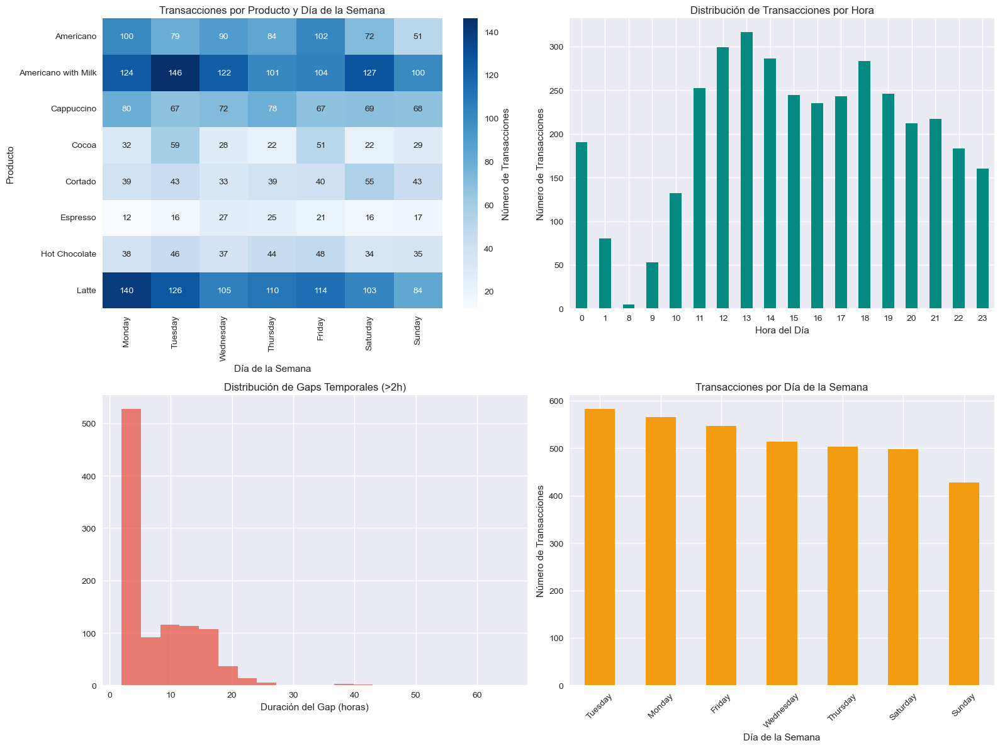

=== ANÁLISIS DE COBERTURA ===
total_gaps: 1019
max_gap_hours: 65.03139305555555
operating_hours: 0-23
most_active_day: Tuesday
least_active_day: Sunday


In [7]:
def analyze_data_coverage_and_gaps(df: pd.DataFrame) -> Dict:
    """Análisis detallado de cobertura temporal y gaps en datos"""

    df_temp = df.copy()
    
    # CONVERSIÓN ROBUSTA DE FECHAS - SOLUCIÓN DEFINITIVA
    print("Convirtiendo fechas...")
    df_temp['datetime'] = pd.to_datetime(df_temp['datetime'], errors='coerce', utc=True)
    
    # Verificar y manejar valores nulos
    if df_temp['datetime'].isna().sum() > 0:
        print(f"Advertencia: {df_temp['datetime'].isna().sum()} fechas no pudieron ser convertidas")
        
        # Intentar conversión alternativa para los valores problemáticos
        problematic_dates = df_temp[df_temp['datetime'].isna()].copy()
        problematic_dates['datetime'] = pd.to_datetime(
            problematic_dates['datetime'].astype(str).str.replace(r'\+0[23]:00$', '', regex=True),
            errors='coerce'
        )
        # Reemplazar los valores nulos con la conversión alternativa
        df_temp.update(problematic_dates)
    
    # Eliminar filas con fechas aún nulas
    initial_count = len(df_temp)
    df_temp = df_temp.dropna(subset=['datetime'])
    final_count = len(df_temp)
    
    if initial_count != final_count:
        print(f"Se eliminaron {initial_count - final_count} registros con fechas inválidas")
    
    # Convertir a timezone local (Europe/Kiev)
    df_temp['datetime'] = df_temp['datetime'].dt.tz_convert('Europe/Kiev')
    
    df_temp = df_temp.sort_values('datetime')

    # Análisis de gaps temporales
    time_diffs = df_temp['datetime'].diff().dropna()

    # Identificar gaps significativos (>2 horas)
    significant_gaps = time_diffs[time_diffs > pd.Timedelta(hours=2)]

    # Análisis por hora del día
    df_temp['hour'] = df_temp['datetime'].dt.hour
    hourly_distribution = df_temp['hour'].value_counts().sort_index()

    # Análisis por día de la semana
    df_temp['dow'] = df_temp['datetime'].dt.day_name()
    dow_distribution = df_temp['dow'].value_counts()

    # Heatmap mejorado de presencia
    pivot_presence = pd.pivot_table(
        df_temp, values='money', index='coffee_name', columns='dow',
        aggfunc='count', fill_value=0
    )

    # Ordenar días de la semana correctamente
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    pivot_presence = pivot_presence.reindex(columns=day_order, fill_value=0)

    # Visualización mejorada
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Heatmap de presencia por día
    sns.heatmap(pivot_presence, annot=True, fmt="d", cmap="Blues",
                cbar_kws={'label': 'Número de Transacciones'}, ax=axes[0,0])
    axes[0,0].set_title("Transacciones por Producto y Día de la Semana")
    axes[0,0].set_xlabel("Día de la Semana")
    axes[0,0].set_ylabel("Producto")

    # Distribución horaria
    hourly_distribution.plot(kind='bar', ax=axes[0,1], color=COLORS['secondary'])
    axes[0,1].set_title("Distribución de Transacciones por Hora")
    axes[0,1].set_xlabel("Hora del Día")
    axes[0,1].set_ylabel("Número de Transacciones")
    axes[0,1].tick_params(axis='x', rotation=0)

    # Gaps temporales
    if len(significant_gaps) > 0:
        gap_hours = significant_gaps.dt.total_seconds() / 3600
        axes[1,0].hist(gap_hours, bins=20, alpha=0.7, color=COLORS['warning'])
        axes[1,0].set_title("Distribución de Gaps Temporales (>2h)")
        axes[1,0].set_xlabel("Duración del Gap (horas)")
    else:
        axes[1,0].text(0.5, 0.5, 'No se encontraron gaps significativos',
                      ha='center', va='center', transform=axes[1,0].transAxes)
        axes[1,0].set_title("Gaps Temporales")

    # Cobertura por día de la semana
    dow_distribution.plot(kind='bar', ax=axes[1,1], color=COLORS['accent'])
    axes[1,1].set_title("Transacciones por Día de la Semana")
    axes[1,1].set_xlabel("Día de la Semana")
    axes[1,1].set_ylabel("Número de Transacciones")
    axes[1,1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.savefig(CONFIG['FIGURES_PATH'] / 'data_coverage_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    return {
        'total_gaps': len(significant_gaps),
        'max_gap_hours': time_diffs.max().total_seconds() / 3600 if len(time_diffs) > 0 else 0,
        'operating_hours': f"{hourly_distribution.index.min()}-{hourly_distribution.index.max()}",
        'most_active_day': dow_distribution.index[0],
        'least_active_day': dow_distribution.index[-1],
        'hourly_distribution': hourly_distribution.to_dict(),
        'dow_distribution': dow_distribution.to_dict()
    }

# Ejecutar análisis
coverage_results = analyze_data_coverage_and_gaps(df_raw)
print("=== ANÁLISIS DE COBERTURA ===")
for key, value in coverage_results.items():
    if not isinstance(value, dict):  # No imprimir diccionarios completos
        print(f"{key}: {value}")

### 5. Construcción de df_clean mejorada

- ¿Por qué?: Crear dataset limpio y enriquecido para análisis posteriores
- ¿Qué muestra?: Limpieza de datos, creación de variables temporales, categorización
- Decisiones: Mantener todos los registros válidos, crear variables derivadas útiles
- ¿Cuándo?: Base para todos los análisis posteriores

In [8]:
def create_robust_clean_dataset(df_raw: pd.DataFrame) -> pd.DataFrame:
    """Construcción robusta del dataset limpio"""

    df_clean = df_raw.copy()
    initial_rows = len(df_clean)

    # 1. Conversión robusta de datetime
    df_clean['datetime'] = pd.to_datetime(df_clean['datetime'], errors='coerce', utc=True)
    
    # 2. Eliminar filas con datetime inválido
    df_clean = df_clean[df_clean['datetime'].notna()]
    
    # 3. Convertir a timezone local
    df_clean['datetime'] = df_clean['datetime'].dt.tz_convert('Europe/Kiev')
    
    # 4. Limpieza de money
    df_clean['money'] = pd.to_numeric(df_clean['money'], errors='coerce')
    df_clean = df_clean[df_clean['money'].notna() & (df_clean['money'] >= 0)]
    
    # 5. Eliminar duplicados y ordenar
    df_clean = df_clean.drop_duplicates().sort_values('datetime').reset_index(drop=True)

    # 6. Crear variables temporales
    df_clean['date'] = df_clean['datetime'].dt.date
    df_clean['hour'] = df_clean['datetime'].dt.hour
    df_clean['dow'] = df_clean['datetime'].dt.day_name()
    df_clean['dow_num'] = df_clean['datetime'].dt.dayofweek
    df_clean['month'] = df_clean['datetime'].dt.month
    df_clean['week'] = df_clean['datetime'].dt.isocalendar().week
    df_clean['is_weekend'] = df_clean['dow_num'].isin([5, 6])

    # 7. Categorizar horarios
    def categorize_time_period(hour):
        if 6 <= hour < 11: return 'Mañana'
        elif 11 <= hour < 14: return 'Medio día'
        elif 14 <= hour < 17: return 'Tarde'
        elif 17 <= hour < 20: return 'Noche'
        else: return 'Fuera de horario'

    df_clean['time_period'] = df_clean['hour'].apply(categorize_time_period)

    # 8. Reporte
    cleanup_report = {
        'initial_rows': initial_rows,
        'final_rows': len(df_clean),
        'rows_removed': initial_rows - len(df_clean),
        'removal_percentage': (initial_rows - len(df_clean)) / initial_rows * 100,
        'date_range': f"{df_clean['datetime'].min()} to {df_clean['datetime'].max()}",
        'unique_products': df_clean['coffee_name'].nunique(),
        'total_revenue': df_clean['money'].sum()
    }

    print("=== REPORTE DE LIMPIEZA ===")
    for key, value in cleanup_report.items():
        print(f"{key}: {value}")

    return df_clean, cleanup_report

# Ejecutar
df_clean, cleanup_report = create_robust_clean_dataset(df_raw)

=== REPORTE DE LIMPIEZA ===
initial_rows: 3636
final_rows: 3636
rows_removed: 0
removal_percentage: 0.0
date_range: 2024-03-01 12:15:50.520000+02:00 to 2025-03-23 20:11:38.635000+02:00
unique_products: 8
total_revenue: 115431.58


### 5.1 Visualización de los datos 

In [9]:
if 'df_clean' in locals() and df_clean is not None:
    print("\n" + "="*50)
    print("INFORMACIÓN DEL DATASET")
    print("="*50)
    print(f"Shape del DataFrame: {df_clean.shape}")
    print(f"Rows: {df_clean.shape[0]:,}")
    print(f"Columns: {df_clean.shape[1]}")
    print(f"Available columns: {list(df_clean.columns)}")
    print("="*50)
else:
    print("No hay datos cargados para mostrar el shape")


INFORMACIÓN DEL DATASET
Shape del DataFrame: (3636, 13)
Rows: 3,636
Columns: 13
Available columns: ['date', 'datetime', 'cash_type', 'card', 'money', 'coffee_name', 'hour', 'dow', 'dow_num', 'month', 'week', 'is_weekend', 'time_period']


In [10]:
display(df_clean.head())

,date,datetime,cash_type,card,money,coffee_name,hour,dow,dow_num,month,week,is_weekend,time_period
0,2024-03-01,2024-03-01 12:15:50.520000+02:00,card,ANON-0000-0000-0001,38.70,Latte,12,Friday,4,3,9,False,Medio día
1,2024-03-01,2024-03-01 14:19:22.539000+02:00,card,ANON-0000-0000-0002,38.70,Hot Chocolate,14,Friday,4,3,9,False,Tarde
2,2024-03-01,2024-03-01 14:20:18.089000+02:00,card,ANON-0000-0000-0002,38.70,Hot Chocolate,14,Friday,4,3,9,False,Tarde
3,2024-03-01,2024-03-01 15:46:33.006000+02:00,card,ANON-0000-0000-0003,28.90,Americano,15,Friday,4,3,9,False,Tarde
4,2024-03-01,2024-03-01 15:48:14.626000+02:00,card,ANON-0000-0000-0004,38.70,Latte,15,Friday,4,3,9,False,Tarde


### 6. Análisis de estacionalidad avanzado

- ¿Por qué?: Identificar patrones cíclicos para predicción y planificación
- ¿Qué muestra?: Descomposición temporal, tendencias, estacionalidad
- Decisiones: Período de 7 días para descomposición, múltiples agregaciones temporales
- ¿Cuándo?: Para entender comportamiento temporal del negocio

In [11]:
def advanced_seasonality_analysis(df: pd.DataFrame) -> Dict:
    """Análisis avanzado de patrones estacionales y tendencias"""

    # Preparar series temporal
    ts = df[['datetime', 'money']].set_index('datetime').sort_index()
    ts_daily = ts['money'].resample('D').agg(['sum', 'count', 'mean']).fillna(0)
    ts_weekly = ts['money'].resample('W').sum()
    
    # MÁXIMA COMPATIBILIDAD: Usar pd.Grouper
    ts_monthly = ts['money'].groupby(pd.Grouper(freq='M')).sum()

    # Descomposición estacional
    if len(ts_daily) >= 14:  # Necesario para descomposición
        decomposition = seasonal_decompose(ts_daily['sum'], model='additive', period=7)

    # Análisis de correlaciones temporales
    df_temp = df.copy()
    df_temp['lag_1'] = df_temp.groupby('coffee_name')['money'].shift(1)
    df_temp['lag_7'] = df_temp.groupby('coffee_name')['money'].shift(7)

    # Visualización mejorada
    fig = make_subplots(
        rows=3, cols=2,
        subplot_titles=('Revenue Diario', 'Revenue Semanal',
                       'Revenue Mensual', 'Descomposición: Tendencia',
                       'Descomposición: Estacional', 'Descomposición: Residual'),
        vertical_spacing=0.08
    )

    # Revenue diario
    fig.add_trace(
        go.Scatter(x=ts_daily.index, y=ts_daily['sum'],
                  name='Revenue Diario', line=dict(color=COLORS['primary'])),
        row=1, col=1
    )

    # Revenue semanal
    fig.add_trace(
        go.Scatter(x=ts_weekly.index, y=ts_weekly.values,
                  name='Revenue Semanal', line=dict(color=COLORS['secondary'])),
        row=1, col=2
    )

    # Revenue mensual
    fig.add_trace(
        go.Bar(x=ts_monthly.index, y=ts_monthly.values,
               name='Revenue Mensual', marker_color=COLORS['accent']),
        row=2, col=1
    )

    # Descomposición (si es posible)
    if len(ts_daily) >= 14:
        fig.add_trace(
            go.Scatter(x=ts_daily.index, y=decomposition.trend,
                      name='Tendencia', line=dict(color=COLORS['success'])),
            row=2, col=2
        )

        fig.add_trace(
            go.Scatter(x=ts_daily.index, y=decomposition.seasonal,
                      name='Estacional', line=dict(color=COLORS['warning'])),
            row=3, col=1
        )

        fig.add_trace(
            go.Scatter(x=ts_daily.index, y=decomposition.resid,
                      name='Residual', line=dict(color='gray')),
            row=3, col=2
        )

    fig.update_layout(height=900, showlegend=False,
                     title_text="Análisis de Estacionalidad y Tendencias")
    fig.show()

    # Estadísticas de estacionalidad
    seasonality_stats = {
        'daily_avg_revenue': ts_daily['sum'].mean(),
        'daily_std_revenue': ts_daily['sum'].std(),
        'weekly_avg_revenue': ts_weekly.mean(),
        'monthly_avg_revenue': ts_monthly.mean(),
        'coefficient_of_variation': ts_daily['sum'].std() / ts_daily['sum'].mean(),
        'peak_day': ts_daily['sum'].idxmax(),
        'lowest_day': ts_daily['sum'].idxmin()
    }

    return seasonality_stats

# Ejecutar análisis
seasonality_results = advanced_seasonality_analysis(df_clean)
print("=== ANÁLISIS DE ESTACIONALIDAD ===")
for key, value in seasonality_results.items():
    print(f"{key}: {value}")

=== ANÁLISIS DE ESTACIONALIDAD ===
daily_avg_revenue: 297.50407216494847
daily_std_revenue: 163.0944207776618
weekly_avg_revenue: 2061.2782142857145
monthly_avg_revenue: 8879.352307692308
coefficient_of_variation: 0.5482090365715585
peak_day: 2025-02-03 00:00:00+02:00
lowest_day: 2024-05-01 00:00:00+03:00


### 7.  Análisis pareto avanzado

- ¿Por qué?: Identificar productos y horarios más rentables (regla 80/20)
- ¿Qué muestra?: Concentración de revenue, productos estrella, horarios pico
- Decisiones: Análisis por producto, hora y día, cálculo de coeficiente Gini
- ¿Cuándo?: Para optimización operativa y estratégica

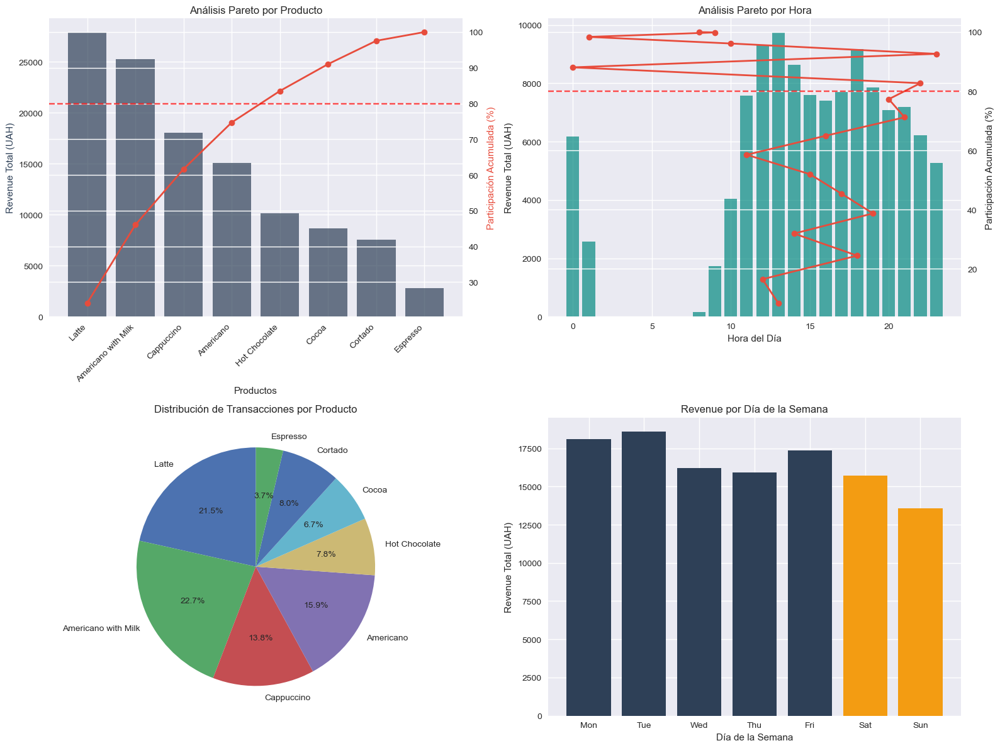

=== ANÁLISIS PARETO AVANZADO ===
top_20_percent_products: 4
revenue_concentration_80_20: 0.7470383754601643
most_profitable_product: Latte
least_profitable_product: Espresso
gini_coefficient: 0.3216117071255544
top_revenue_hours: [13, 12, 18]
peak_revenue_day: Tuesday


In [12]:
def advanced_pareto_analysis(df: pd.DataFrame) -> Dict:
    """Análisis Pareto 80/20 avanzado con múltiples dimensiones"""

    # Análisis por producto
    product_revenue = df.groupby('coffee_name')['money'].agg(['sum', 'count', 'mean']).round(2)
    product_revenue.columns = ['total_revenue', 'transactions', 'avg_price']
    product_revenue = product_revenue.sort_values('total_revenue', ascending=False)
    product_revenue['revenue_share'] = product_revenue['total_revenue'] / product_revenue['total_revenue'].sum()
    product_revenue['cumulative_share'] = product_revenue['revenue_share'].cumsum()

    # Identificar productos 80/20
    pareto_80_products = product_revenue[product_revenue['cumulative_share'] <= 0.8].index.tolist()

    # Análisis por hora
    hourly_revenue = df.groupby('hour')['money'].agg(['sum', 'count']).round(2)
    hourly_revenue.columns = ['total_revenue', 'transactions']
    hourly_revenue['revenue_share'] = hourly_revenue['total_revenue'] / hourly_revenue['total_revenue'].sum()
    hourly_revenue = hourly_revenue.sort_values('total_revenue', ascending=False)
    hourly_revenue['cumulative_share'] = hourly_revenue['revenue_share'].cumsum()

    # Análisis por día de la semana
    dow_revenue = df.groupby('dow')['money'].agg(['sum', 'count', 'mean']).round(2)
    dow_revenue.columns = ['total_revenue', 'transactions', 'avg_transaction']
    dow_revenue['revenue_share'] = dow_revenue['total_revenue'] / dow_revenue['total_revenue'].sum()
    dow_revenue = dow_revenue.sort_values('total_revenue', ascending=False)

    # Visualización mejorada
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Pareto por producto
    ax1 = axes[0,0]
    ax1_twin = ax1.twinx()

    bars = ax1.bar(range(len(product_revenue)), product_revenue['total_revenue'],
                   alpha=0.7, color=COLORS['primary'], label='Revenue por Producto')
    line = ax1_twin.plot(range(len(product_revenue)), product_revenue['cumulative_share'] * 100,
                        color=COLORS['warning'], marker='o', linewidth=2,
                        label='% Acumulado')
    ax1_twin.axhline(80, color='red', linestyle='--', alpha=0.7, label='80%')

    ax1.set_xlabel('Productos')
    ax1.set_ylabel('Revenue Total (UAH)', color=COLORS['primary'])
    ax1_twin.set_ylabel('Participación Acumulada (%)', color=COLORS['warning'])
    ax1.set_title('Análisis Pareto por Producto')
    ax1.set_xticks(range(len(product_revenue)))
    ax1.set_xticklabels(product_revenue.index, rotation=45, ha='right')

    # Pareto por hora
    ax2 = axes[0,1]
    ax2_twin = ax2.twinx()

    ax2.bar(hourly_revenue.index, hourly_revenue['total_revenue'],
            alpha=0.7, color=COLORS['secondary'])
    ax2_twin.plot(hourly_revenue.index, hourly_revenue['cumulative_share'] * 100,
                 color=COLORS['warning'], marker='o', linewidth=2)
    ax2_twin.axhline(80, color='red', linestyle='--', alpha=0.7)

    ax2.set_xlabel('Hora del Día')
    ax2.set_ylabel('Revenue Total (UAH)')
    ax2_twin.set_ylabel('Participación Acumulada (%)')
    ax2.set_title('Análisis Pareto por Hora')

    # Distribución de transacciones por producto
    axes[1,0].pie(product_revenue['transactions'], labels=product_revenue.index,
                  autopct='%1.1f%%', startangle=90)
    axes[1,0].set_title('Distribución de Transacciones por Producto')

    # Revenue por día de la semana
    dow_revenue_sorted = dow_revenue.sort_index()
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    dow_revenue_ordered = dow_revenue_sorted.reindex(day_order, fill_value=0)

    axes[1,1].bar(range(len(dow_revenue_ordered)), dow_revenue_ordered['total_revenue'],
                  color=[COLORS['accent'] if day in ['Saturday', 'Sunday'] else COLORS['primary']
                        for day in dow_revenue_ordered.index])
    axes[1,1].set_xlabel('Día de la Semana')
    axes[1,1].set_ylabel('Revenue Total (UAH)')
    axes[1,1].set_title('Revenue por Día de la Semana')
    axes[1,1].set_xticks(range(len(dow_revenue_ordered)))
    axes[1,1].set_xticklabels([day[:3] for day in dow_revenue_ordered.index])

    plt.tight_layout()
    plt.savefig(CONFIG['FIGURES_PATH'] / 'pareto_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Métricas de concentración
    pareto_metrics = {
        'top_20_percent_products': len(pareto_80_products),
        'revenue_concentration_80_20': product_revenue.loc[pareto_80_products, 'total_revenue'].sum() / product_revenue['total_revenue'].sum(),
        'most_profitable_product': product_revenue.index[0],
        'least_profitable_product': product_revenue.index[-1],
        'gini_coefficient': calculate_gini_coefficient(product_revenue['total_revenue']),
        'top_revenue_hours': hourly_revenue.head(3).index.tolist(),
        'peak_revenue_day': dow_revenue.index[0]
    }

    return pareto_metrics, product_revenue, hourly_revenue, dow_revenue

def calculate_gini_coefficient(values):
    """Calcula el coeficiente de Gini para medir concentración"""
    sorted_values = np.sort(values)
    n = len(values)
    cumsum = np.cumsum(sorted_values)
    return (n + 1 - 2 * np.sum(cumsum) / cumsum[-1]) / n

# Ejecutar análisis Pareto
pareto_metrics, product_stats, hourly_stats, dow_stats = advanced_pareto_analysis(df_clean)
print("=== ANÁLISIS PARETO AVANZADO ===")
for key, value in pareto_metrics.items():
    print(f"{key}: {value}")

### 8. Heatmap avanzado hora por producto

- ¿Por qué?: Visualizar patrones complejos de consumo
- ¿Qué muestra?: Intersección hora-producto, correlaciones, normalización
- Decisiones: Múltiples métricas (absoluto, normalizado, conteo, precio), correlaciones
- ¿Cuándo?: Para estrategias de inventory y pricing por horario

Horas disponibles en los datos: ['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '8', '9']


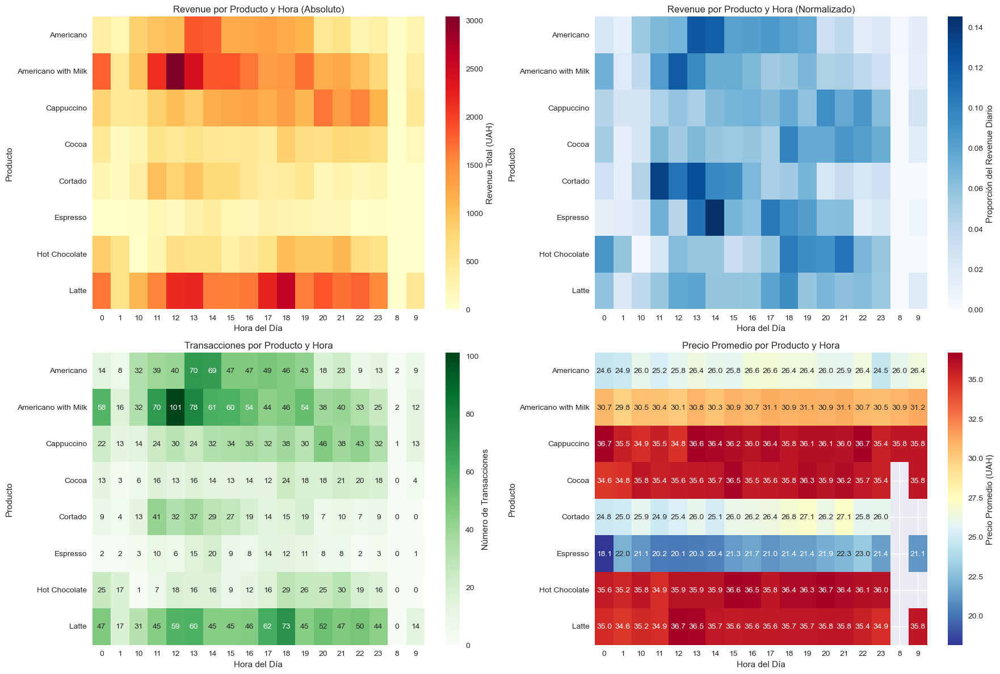

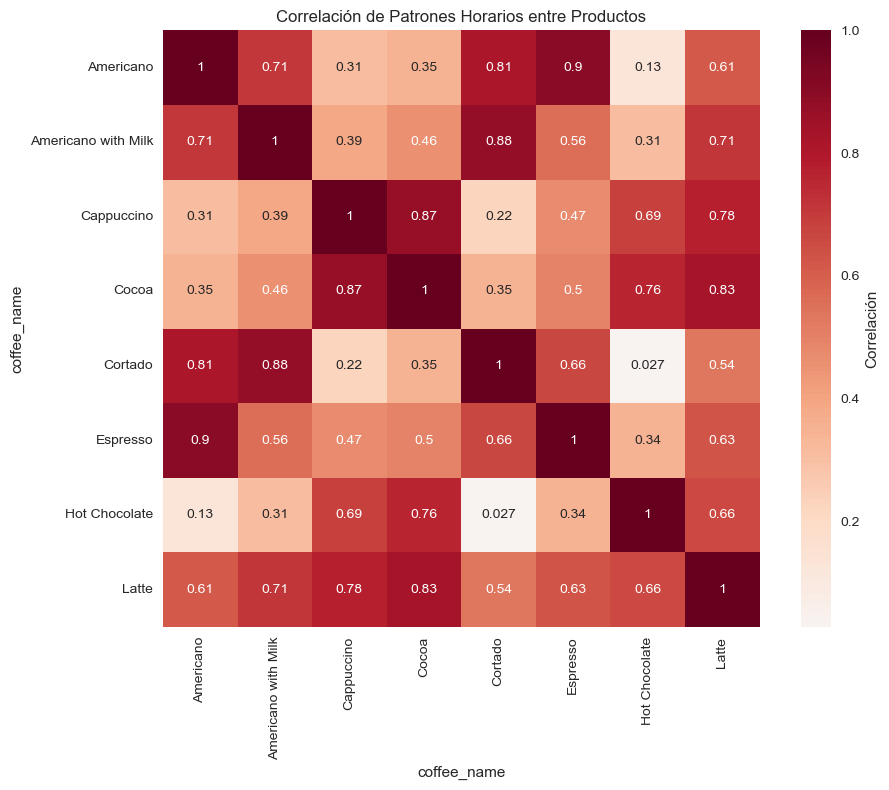

=== INSIGHTS DEL HEATMAP ===
peak_hours_by_product: {'Americano': '13', 'Americano with Milk': '12', 'Cappuccino': '20', 'Cocoa': '18', 'Cortado': '11', 'Espresso': '14', 'Hot Chocolate': '21', 'Latte': '18'}
most_active_hours: ['13', '12', '18', '14', '19']
least_active_hours: ['8', '9', '1']
morning_products: ['Cortado', 'Americano with Milk', 'Americano']
afternoon_products: ['Americano', 'Cortado', 'Espresso']
evening_products: ['Hot Chocolate', 'Cocoa', 'Cappuccino']


In [13]:
def create_advanced_product_hour_heatmap(df: pd.DataFrame) -> Dict:
    """Crea heatmap avanzado con análisis de patrones hora x producto"""
    
    # Asegurar que las horas sean strings para consistencia
    df['hour'] = df['hour'].astype(str)
    
    # Crear pivot con múltiples métricas
    pivot_revenue = pd.pivot_table(
        df, values='money', index='coffee_name', columns='hour',
        aggfunc='sum', fill_value=0
    )

    pivot_count = pd.pivot_table(
        df, values='money', index='coffee_name', columns='hour',
        aggfunc='count', fill_value=0
    )

    pivot_avg = pd.pivot_table(
        df, values='money', index='coffee_name', columns='hour',
        aggfunc='mean', fill_value=0
    )

    # Normalizar por fila para mostrar patrones relativos
    pivot_revenue_norm = pivot_revenue.div(pivot_revenue.sum(axis=1), axis=0).fillna(0)
    
    # Debug: mostrar columnas disponibles
    print("Horas disponibles en los datos:", sorted(pivot_revenue.columns.tolist()))

    # Crear visualización con subplots
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))

    # Heatmap de revenue absoluto
    sns.heatmap(pivot_revenue, annot=False, cmap='YlOrRd',
                cbar_kws={'label': 'Revenue Total (UAH)'}, ax=axes[0,0])
    axes[0,0].set_title('Revenue por Producto y Hora (Absoluto)')
    axes[0,0].set_xlabel('Hora del Día')
    axes[0,0].set_ylabel('Producto')

    # Heatmap de revenue normalizado
    sns.heatmap(pivot_revenue_norm, annot=False, cmap='Blues',
                cbar_kws={'label': 'Proporción del Revenue Diario'}, ax=axes[0,1])
    axes[0,1].set_title('Revenue por Producto y Hora (Normalizado)')
    axes[0,1].set_xlabel('Hora del Día')
    axes[0,1].set_ylabel('Producto')

    # Heatmap de número de transacciones
    sns.heatmap(pivot_count, annot=True, fmt='d', cmap='Greens',
                cbar_kws={'label': 'Número de Transacciones'}, ax=axes[1,0])
    axes[1,0].set_title('Transacciones por Producto y Hora')
    axes[1,0].set_xlabel('Hora del Día')
    axes[1,0].set_ylabel('Producto')

    # Heatmap de precio promedio
    pivot_avg_clean = pivot_avg.replace(0, np.nan)  # Evitar mostrar 0 donde no hay transacciones
    sns.heatmap(pivot_avg_clean, annot=True, fmt='.1f', cmap='RdYlBu_r',
                cbar_kws={'label': 'Precio Promedio (UAH)'}, ax=axes[1,1])
    axes[1,1].set_title('Precio Promedio por Producto y Hora')
    axes[1,1].set_xlabel('Hora del Día')
    axes[1,1].set_ylabel('Producto')

    plt.tight_layout()
    plt.savefig(CONFIG['FIGURES_PATH'] / 'advanced_hour_product_heatmap.png',
                dpi=300, bbox_inches='tight')
    plt.show()

    # Análisis de patrones
    peak_hours_by_product = {}
    for product in pivot_revenue.index:
        peak_hour = pivot_revenue.loc[product].idxmax()
        peak_hours_by_product[product] = peak_hour

    # Análisis de correlaciones entre productos por hora
    product_hour_corr = pivot_revenue.T.corr()

    # Visualizar matriz de correlación
    plt.figure(figsize=(10, 8))
    sns.heatmap(product_hour_corr, annot=True, cmap='RdBu_r', center=0,
                square=True, cbar_kws={'label': 'Correlación'})
    plt.title('Correlación de Patrones Horarios entre Productos')
    plt.tight_layout()
    plt.savefig(CONFIG['FIGURES_PATH'] / 'product_correlation_matrix.png',
                dpi=300, bbox_inches='tight')
    plt.show()

    # Identificar clusters de comportamiento
    most_active_hours = pivot_revenue.sum().nlargest(5).index.tolist()
    least_active_hours = pivot_revenue.sum().nsmallest(3).index.tolist()

    # Convertir rangos de horas a strings y filtrar solo las existentes
    available_hours = pivot_revenue_norm.columns.tolist()
    
    morning_hours = [str(h) for h in range(6, 12) if str(h) in available_hours]
    afternoon_hours = [str(h) for h in range(12, 18) if str(h) in available_hours]
    evening_hours = [str(h) for h in range(18, 22) if str(h) in available_hours]

    heatmap_insights = {
        'peak_hours_by_product': peak_hours_by_product,
        'most_active_hours': most_active_hours,
        'least_active_hours': least_active_hours,
        'morning_products': identify_time_period_products(pivot_revenue_norm, morning_hours),
        'afternoon_products': identify_time_period_products(pivot_revenue_norm, afternoon_hours),
        'evening_products': identify_time_period_products(pivot_revenue_norm, evening_hours)
    }

    return heatmap_insights, pivot_revenue, pivot_count, pivot_avg


def identify_time_period_products(pivot_norm: pd.DataFrame, hours: list) -> List[str]:
    """Identifica productos que tienen mayor actividad en un período específico"""
    
    if not hours:  # Si no hay horas disponibles en ese período
        return ["No data available"]
    
    try:
        period_activity = pivot_norm[hours].sum(axis=1)
        return period_activity.nlargest(3).index.tolist()
    except KeyError as e:
        print(f"Advertencia: Horas no encontradas en los datos: {e}")
        return ["Data unavailable"]


# Ejecutar análisis de heatmap con manejo de errores
try:
    heatmap_insights, revenue_pivot, count_pivot, avg_pivot = create_advanced_product_hour_heatmap(df_clean)
    print("=== INSIGHTS DEL HEATMAP ===")
    for key, value in heatmap_insights.items():
        print(f"{key}: {value}")
        
except Exception as e:
    print(f"Error durante la ejecución: {e}")
    print("Verifique la estructura de los datos y las columnas disponibles")
    
    # Mostrar información de debug
    print("\n=== DEBUG INFO ===")
    print(f"Columnas en df_clean: {df_clean.columns.tolist()}")
    print(f"Valores únicos en 'hour': {sorted(df_clean['hour'].unique())}")
    print(f"Valores únicos en 'coffee_name': {df_clean['coffee_name'].unique()}")
    print(f"Valores únicos en 'money': muestra - {df_clean['money'].head().tolist()}")

### 9. Análisis de revenue acumulado y tendencias

- ¿Por qué?: Evaluar crecimiento y performance del negocio
- ¿Qué muestra?: Métricas acumuladas, velocidad de crecimiento, detección de tendencias
- Decisiones: Rolling averages para suavizar, detección de outliers por Z-score
- ¿Cuándo?: Para evaluación de performance y proyecciones

In [14]:
def comprehensive_revenue_analysis(df: pd.DataFrame) -> Dict:
    """Análisis comprehensivo de revenue con tendencias y proyecciones"""

    df_sorted = df.sort_values('datetime').copy()

    # Calcular métricas acumuladas
    df_sorted['cumulative_revenue'] = df_sorted['money'].cumsum()
    df_sorted['cumulative_transactions'] = range(1, len(df_sorted) + 1)
    df_sorted['running_avg_transaction'] = df_sorted['cumulative_revenue'] / df_sorted['cumulative_transactions']

    # Análisis de velocidad de crecimiento
    df_sorted['date'] = df_sorted['datetime'].dt.date
    daily_stats = df_sorted.groupby('date').agg({
        'money': ['sum', 'count', 'mean'],
        'cumulative_revenue': 'last'
    }).reset_index()

    daily_stats.columns = ['date', 'daily_revenue', 'daily_transactions', 'avg_transaction', 'cumulative_revenue']
    daily_stats['daily_growth'] = daily_stats['daily_revenue'].pct_change()
    daily_stats['revenue_velocity'] = daily_stats['daily_revenue'] / daily_stats['daily_transactions']

    # Rolling averages para suavizar tendencias
    daily_stats['revenue_ma_7'] = daily_stats['daily_revenue'].rolling(window=7, min_periods=1).mean()
    daily_stats['revenue_ma_30'] = daily_stats['daily_revenue'].rolling(window=30, min_periods=1).mean()

    # Detectar cambios de tendencia
    def detect_trend_changes(series, window=7):
        """Detecta cambios significativos en la tendencia"""
        rolling_diff = series.rolling(window=window).apply(lambda x: x.iloc[-1] - x.iloc[0])
        return rolling_diff

    daily_stats['trend_change'] = detect_trend_changes(daily_stats['revenue_ma_7'])

    # Visualización avanzada
    fig = make_subplots(
        rows=3, cols=2,
        subplot_titles=('Revenue Acumulado', 'Revenue Diario con Tendencias',
                       'Crecimiento Diario (%)', 'Transacciones vs Revenue',
                       'Precio Promedio por Transacción', 'Velocidad de Revenue'),
        vertical_spacing=0.08,
        specs=[[{"secondary_y": False}, {"secondary_y": True}],
               [{"secondary_y": False}, {"secondary_y": False}],
               [{"secondary_y": False}, {"secondary_y": False}]]
    )

    # Revenue acumulado
    fig.add_trace(
        go.Scatter(x=df_sorted['datetime'], y=df_sorted['cumulative_revenue'],
                  name='Revenue Acumulado', line=dict(color=COLORS['primary'], width=2)),
        row=1, col=1
    )

    # Revenue diario con tendencias
    fig.add_trace(
        go.Scatter(x=daily_stats['date'], y=daily_stats['daily_revenue'],
                  name='Revenue Diario', line=dict(color=COLORS['secondary']),
                  opacity=0.6),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(x=daily_stats['date'], y=daily_stats['revenue_ma_7'],
                  name='MA 7 días', line=dict(color=COLORS['accent'], width=2)),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(x=daily_stats['date'], y=daily_stats['revenue_ma_30'],
                  name='MA 30 días', line=dict(color=COLORS['warning'], width=2)),
        row=1, col=2
    )

    # Crecimiento diario
    growth_colors = ['green' if x > 0 else 'red' for x in daily_stats['daily_growth'].fillna(0)]
    fig.add_trace(
        go.Bar(x=daily_stats['date'], y=daily_stats['daily_growth'] * 100,
               name='Crecimiento %', marker_color=growth_colors),
        row=2, col=1
    )

    # Scatter transacciones vs revenue
    fig.add_trace(
        go.Scatter(x=daily_stats['daily_transactions'], y=daily_stats['daily_revenue'],
                  mode='markers', name='Días',
                  marker=dict(size=8, color=COLORS['primary'], opacity=0.7)),
        row=2, col=2
    )

    # Precio promedio por transacción
    fig.add_trace(
        go.Scatter(x=daily_stats['date'], y=daily_stats['avg_transaction'],
                  name='Precio Promedio', line=dict(color=COLORS['success'])),
        row=3, col=1
    )

    # Velocidad de revenue
    fig.add_trace(
        go.Scatter(x=daily_stats['date'], y=daily_stats['revenue_velocity'],
                  name='Revenue/Transacción', line=dict(color=COLORS['warning'])),
        row=3, col=2
    )

    fig.update_layout(height=1000, showlegend=True,
                     title_text="Análisis Comprehensivo de Revenue y Tendencias")
    fig.show()

    # Métricas de performance
    total_days = len(daily_stats)
    avg_daily_revenue = daily_stats['daily_revenue'].mean()
    revenue_std = daily_stats['daily_revenue'].std()
    max_daily_revenue = daily_stats['daily_revenue'].max()
    min_daily_revenue = daily_stats['daily_revenue'].min()

    # Detectar días outliers
    revenue_z_scores = np.abs(stats.zscore(daily_stats['daily_revenue']))
    outlier_days = daily_stats[revenue_z_scores > 2]['date'].tolist()

    # Análisis de estabilidad
    coefficient_variation = revenue_std / avg_daily_revenue

    revenue_insights = {
        'total_revenue': df_sorted['cumulative_revenue'].iloc[-1],
        'total_transactions': len(df_sorted),
        'avg_transaction_value': df_sorted['money'].mean(),
        'total_operating_days': total_days,
        'avg_daily_revenue': avg_daily_revenue,
        'revenue_stability_cv': coefficient_variation,
        'best_day_revenue': max_daily_revenue,
        'worst_day_revenue': min_daily_revenue,
        'revenue_growth_trend': daily_stats['daily_revenue'].iloc[-7:].mean() / daily_stats['daily_revenue'].iloc[:7].mean() - 1,
        'outlier_days_count': len(outlier_days),
        'revenue_per_day_range': f"{min_daily_revenue:.2f} - {max_daily_revenue:.2f} UAH"
    }

    return revenue_insights, daily_stats

# Ejecutar análisis de revenue
revenue_insights, daily_revenue_stats = comprehensive_revenue_analysis(df_clean)
print("=== ANÁLISIS DE REVENUE COMPREHENSIVO ===")
for key, value in revenue_insights.items():
    print(f"{key}: {value}")

=== ANÁLISIS DE REVENUE COMPREHENSIVO ===
total_revenue: 115431.5799999978
total_transactions: 3636
avg_transaction_value: 31.74685918591859
total_operating_days: 381
avg_daily_revenue: 302.9700262467191
revenue_stability_cv: 0.5263425262323989
best_day_revenue: 796.0
worst_day_revenue: 23.02
revenue_growth_trend: 0.8386068027210887
outlier_days_count: 15
revenue_per_day_range: 23.02 - 796.00 UAH


### 10.  Sistema de recomendaciones operativas

- ¿Por qué?: Convertir insights en acciones concretas
- ¿Qué muestra?: Recomendaciones categorizadas, KPIs operativos, dashboard
- Decisiones: Categorización por tipo de recomendación, cálculo de métricas de diversidad
- ¿Cuándo?: Al final del análisis para generar valor accionable

=== VERIFICACIÓN DE ESTRUCTURAS ===
Product stats columns: ['total_revenue', 'transactions', 'avg_price', 'revenue_share', 'cumulative_share']
Hourly stats columns: ['total_revenue', 'transactions', 'revenue_share', 'cumulative_share']
DOW stats columns: ['total_revenue', 'transactions', 'avg_transaction', 'revenue_share']


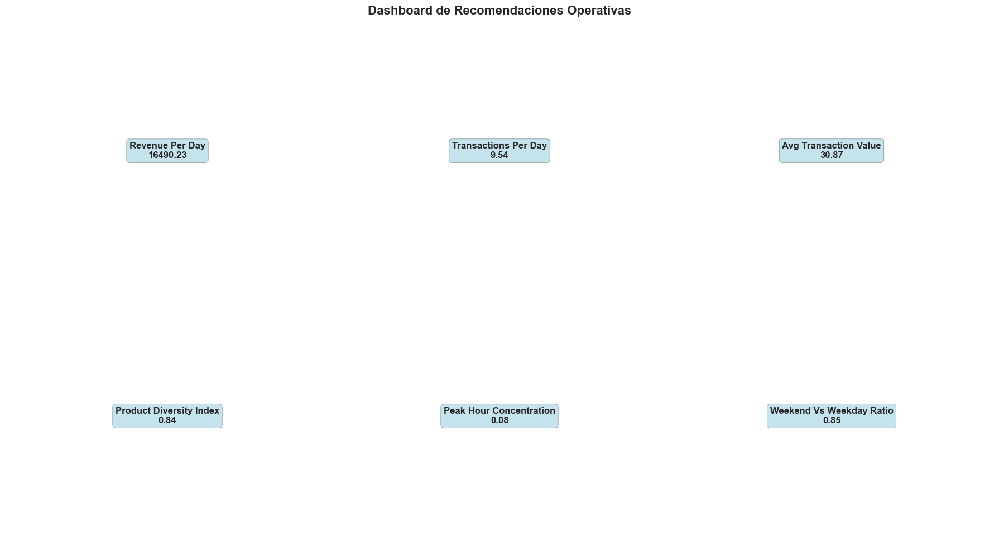

REPORTE DE RECOMENDACIONES OPERATIVAS

INVENTORY MANAGEMENT:
  1. Priorizar stock de productos alta rotación: Americano with Milk, Latte, Americano
  2. Revisar viabilidad de productos baja rotación: Espresso, Cocoa
  3. Implementar sistema de alerta cuando stock < 454 unidades

OPERATIONAL HOURS:
  1. Horas pico (mayor atención): [13, 12, 18]
  2. Considerar mantenimiento en horas: [8, 9]
  3. Horario operativo sugerido: 0:00 - 23:00


In [15]:
def generate_operational_recommendations(df: pd.DataFrame,
                                       product_stats: pd.DataFrame,
                                       hourly_stats: pd.DataFrame,
                                       daily_stats: pd.DataFrame) -> Dict:
    """Genera recomendaciones operativas basadas en análisis de datos"""

    recommendations = {
        'inventory_management': [],
        'operational_hours': [],
        'product_mix': [],
        'pricing_strategy': [],
        'maintenance_alerts': []
    }

    # Análisis de inventario - manejar diferentes nombres de columnas
    transactions_col = next((col for col in product_stats.columns if 'transact' in col.lower()), product_stats.columns[0])
    revenue_col = next((col for col in product_stats.columns if 'revenue' in col.lower() or 'money' in col.lower()), product_stats.columns[1])
    price_col = next((col for col in product_stats.columns if 'price' in col.lower() or 'avg' in col.lower()), product_stats.columns[2])

    high_volume_products = product_stats.nlargest(3, transactions_col).index.tolist()
    low_volume_products = product_stats.nsmallest(2, transactions_col).index.tolist()

    recommendations['inventory_management'].extend([
        f"Priorizar stock de productos alta rotación: {', '.join(high_volume_products)}",
        f"Revisar viabilidad de productos baja rotación: {', '.join(low_volume_products)}",
        f"Implementar sistema de alerta cuando stock < {df.groupby('coffee_name').size().mean():.0f} unidades"
    ])

    # Análisis de horarios operativos
    hourly_revenue_col = next((col for col in hourly_stats.columns if 'revenue' in col.lower() or 'money' in col.lower()), hourly_stats.columns[0])
    
    peak_hours = hourly_stats.nlargest(3, hourly_revenue_col).index.tolist()
    low_activity_hours = hourly_stats.nsmallest(2, hourly_revenue_col).index.tolist()

    recommendations['operational_hours'].extend([
        f"Horas pico (mayor atención): {peak_hours}",
        f"Considerar mantenimiento en horas: {low_activity_hours}",
        f"Horario operativo sugerido: {hourly_stats.index.min()}:00 - {hourly_stats.index.max()}:00"
    ])

    # Análisis de mix de productos
    revenue_concentration = (product_stats[revenue_col].iloc[:3].sum() /
                           product_stats[revenue_col].sum())

    if revenue_concentration > 0.7:
        recommendations['product_mix'].append(
            "Alta concentración de revenue en pocos productos. Considerar diversificación."
        )

    # Estrategia de precios
    price_variance = product_stats[price_col].std() / product_stats[price_col].mean()
    if price_variance < 0.1:
        recommendations['pricing_strategy'].append(
            "Baja variación en precios. Considerar estrategia de precios diferenciada."
        )

    # Alertas de mantenimiento - manejar diferentes estructuras de daily_stats
    daily_revenue_col = None
    for col in daily_stats.columns:
        if 'revenue' in col.lower() or 'money' in col.lower():
            daily_revenue_col = col
            break
    
    if daily_revenue_col and len(daily_stats) > 1:
        revenue_std = daily_stats[daily_revenue_col].std()
        revenue_mean = daily_stats[daily_revenue_col].mean()
        
        if revenue_mean > 0 and revenue_std / revenue_mean > 0.5:
            recommendations['maintenance_alerts'].append(
                "Alta variabilidad en revenue diario. Revisar funcionamiento de máquina."
            )
    else:
        recommendations['maintenance_alerts'].append(
            "Datos insuficientes para análisis de variabilidad diaria"
        )

    # Calcular KPIs operativos
    kpis = {
        'revenue_per_day': daily_stats[daily_revenue_col].mean() if daily_revenue_col else 0,
        'transactions_per_day': df.groupby('date').size().mean(),
        'avg_transaction_value': product_stats[price_col].mean(),
        'product_diversity_index': calculate_diversity_index(product_stats[transactions_col]),
        'peak_hour_concentration': hourly_stats[hourly_revenue_col].max() / hourly_stats[hourly_revenue_col].sum() if hourly_stats[hourly_revenue_col].sum() > 0 else 0,
        'weekend_vs_weekday_ratio': calculate_weekend_ratio(df)
    }

    # Crear dashboard de recomendaciones
    create_recommendations_dashboard(recommendations, kpis)

    return recommendations, kpis


def calculate_diversity_index(transactions_series):
    """Calcula índice de diversidad de Simpson"""
    
    if transactions_series.sum() == 0:
        return 0
    proportions = transactions_series / transactions_series.sum()
    return 1 - (proportions ** 2).sum()


def calculate_weekend_ratio(df):
    """Calcula ratio de revenue fin de semana vs días laborables"""
    
    if 'is_weekend' not in df.columns:
        
        # Calcular is_weekend si no existe
        df['date'] = pd.to_datetime(df['date'])
        df['is_weekend'] = df['date'].dt.dayofweek >= 5
    
    weekend_revenue = df[df['is_weekend']]['money'].sum()
    weekday_revenue = df[~df['is_weekend']]['money'].sum()
    weekend_days = df[df['is_weekend']]['date'].nunique()
    weekday_days = df[~df['is_weekend']]['date'].nunique()

    if weekday_days == 0:
        return float('inf')

    weekend_avg = weekend_revenue / weekend_days if weekend_days > 0 else 0
    weekday_avg = weekday_revenue / weekday_days

    return weekend_avg / weekday_avg if weekday_avg > 0 else float('inf')


def create_recommendations_dashboard(recommendations: Dict, kpis: Dict):
    """Crea dashboard visual de recomendaciones"""
    try:
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle('Dashboard de Recomendaciones Operativas', fontsize=16, fontweight='bold')

        # KPI Cards
        kpi_names = list(kpis.keys())
        kpi_values = list(kpis.values())

        for i, (ax, name, value) in enumerate(zip(axes.flat[:6], kpi_names, kpi_values)):
            ax.text(0.5, 0.5, f"{name.replace('_', ' ').title()}\n{value:.2f}",
                    ha='center', va='center', fontsize=12, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='lightblue', alpha=0.7, edgecolor='black'))
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.axis('off')

        plt.tight_layout()
        plt.savefig(CONFIG['FIGURES_PATH'] / 'recommendations_dashboard.png', dpi=300, bbox_inches='tight')
        plt.show()
        
    except Exception as e:
        print(f"Error creando dashboard: {e}")

    # Reporte de recomendaciones en texto
    print("=" * 60)
    print("REPORTE DE RECOMENDACIONES OPERATIVAS")
    print("=" * 60)

    for category, recs in recommendations.items():
        if recs:  # Solo mostrar categorías con recomendaciones
            print(f"\n{category.replace('_', ' ').upper()}:")
            for i, rec in enumerate(recs, 1):
                print(f"  {i}. {rec}")


# Primero verificar las estructuras
print("=== VERIFICACIÓN DE ESTRUCTURAS ===")
print("Product stats columns:", product_stats.columns.tolist())
print("Hourly stats columns:", hourly_stats.columns.tolist())
print("DOW stats columns:", dow_stats.columns.tolist())

# Ejecutar generación de recomendaciones
try:
    recommendations, operational_kpis = generate_operational_recommendations(
        df_clean, product_stats, hourly_stats, dow_stats
    )
except Exception as e:
    print(f"Error ejecutando recomendaciones: {e}")
    print("Creando estructura alternativa para daily_stats...")
    
    # Crear daily_stats si no existe
    daily_stats = df_clean.groupby('date').agg(
        daily_revenue=('money', 'sum'),
        daily_transactions=('money', 'count')
    ).reset_index()
    
    recommendations, operational_kpis = generate_operational_recommendations(
        df_clean, product_stats, hourly_stats, daily_stats
    )

### 11. Preparación para Modelos Predictivos

- ¿Por qué?: Preparar features engineered para machine learning
- ¿Qué muestra?: Feature engineering avanzado, lags, rolling windows, encoding
- Decisiones: Grid completo fecha-producto, features cíclicas, lags múltiples
- ¿Cuándo?: Preparación para fase de modelado predictivo

In [16]:
def prepare_features_for_ml(df: pd.DataFrame) -> pd.DataFrame:
    """Prepara features avanzadas para modelos de machine learning"""

    logger.info("Preparando features para ML...")

    # Crear dataset base por día-producto
    df_ml = df.copy()

    # Asegurar que 'hour' sea numérico
    df_ml['hour'] = pd.to_numeric(df_ml['hour'], errors='coerce').fillna(0)

    # Agregar por día y producto
    daily_product = df_ml.groupby(['date', 'coffee_name']).agg({
        'money': ['sum', 'count', 'mean'],
        'hour': ['min', 'max', 'mean']
    }).reset_index()

    # Aplanar columnas multi-nivel
    daily_product.columns = ['date', 'coffee_name', 'revenue', 'transactions',
                           'avg_price', 'first_sale_hour', 'last_sale_hour', 'avg_sale_hour']

    # Crear todas las combinaciones fecha-producto
    all_dates = pd.date_range(start=df_ml['date'].min(), end=df_ml['date'].max(), freq='D')
    all_products = df_ml['coffee_name'].unique()

    date_product_grid = pd.MultiIndex.from_product([all_dates.date, all_products],
                                                  names=['date', 'coffee_name']).to_frame(index=False)

    # Merge con datos reales
    df_features = date_product_grid.merge(daily_product, on=['date', 'coffee_name'], how='left')
    
    # Rellenar valores faltantes
    numeric_cols = ['revenue', 'transactions', 'avg_price', 'first_sale_hour', 'last_sale_hour', 'avg_sale_hour']
    df_features[numeric_cols] = df_features[numeric_cols].fillna(0)

    # Convertir date a datetime
    df_features['date'] = pd.to_datetime(df_features['date'])

    # Features temporales
    df_features['year'] = df_features['date'].dt.year
    df_features['month'] = df_features['date'].dt.month
    df_features['day'] = df_features['date'].dt.day
    df_features['dayofweek'] = df_features['date'].dt.dayofweek
    df_features['quarter'] = df_features['date'].dt.quarter
    df_features['week_of_year'] = df_features['date'].dt.isocalendar().week
    df_features['is_weekend'] = df_features['dayofweek'].isin([5, 6]).astype(int)
    df_features['is_month_start'] = df_features['date'].dt.is_month_start.astype(int)
    df_features['is_month_end'] = df_features['date'].dt.is_month_end.astype(int)

    # Features cíclicas
    df_features['month_sin'] = np.sin(2 * np.pi * df_features['month'] / 12)
    df_features['month_cos'] = np.cos(2 * np.pi * df_features['month'] / 12)
    df_features['dayofweek_sin'] = np.sin(2 * np.pi * df_features['dayofweek'] / 7)
    df_features['dayofweek_cos'] = np.cos(2 * np.pi * df_features['dayofweek'] / 7)

    # Features de lag (valores históricos)
    df_features = df_features.sort_values(['coffee_name', 'date'])

    for product in all_products:
        mask = df_features['coffee_name'] == product

        # Lags de transacciones
        df_features.loc[mask, 'transactions_lag_1'] = df_features.loc[mask, 'transactions'].shift(1)
        df_features.loc[mask, 'transactions_lag_7'] = df_features.loc[mask, 'transactions'].shift(7)
        df_features.loc[mask, 'transactions_lag_14'] = df_features.loc[mask, 'transactions'].shift(14)

        # Rolling means
        df_features.loc[mask, 'transactions_roll_3'] = df_features.loc[mask, 'transactions'].rolling(3, min_periods=1).mean()
        df_features.loc[mask, 'transactions_roll_7'] = df_features.loc[mask, 'transactions'].rolling(7, min_periods=1).mean()
        df_features.loc[mask, 'transactions_roll_30'] = df_features.loc[mask, 'transactions'].rolling(30, min_periods=1).mean()

        # Volatilidad
        df_features.loc[mask, 'transactions_vol_7'] = df_features.loc[mask, 'transactions'].rolling(7, min_periods=1).std().fillna(0)

    # Features de contexto
    daily_totals = df_features.groupby('date').agg({
        'transactions': 'sum',
        'revenue': 'sum'
    }).rename(columns={'transactions': 'total_daily_transactions',
                      'revenue': 'total_daily_revenue'})

    df_features = df_features.merge(daily_totals, on='date', how='left')

    # Market share por producto
    df_features['market_share_transactions'] = np.where(
        df_features['total_daily_transactions'] > 0,
        df_features['transactions'] / df_features['total_daily_transactions'],
        0
    )

    # Features de producto (encoding)
    df_features = pd.get_dummies(df_features, columns=['coffee_name'], prefix='product')

    # Rellenar NaNs de lags con 0
    lag_columns = [col for col in df_features.columns if 'lag' in col or 'roll' in col or 'vol' in col]
    df_features[lag_columns] = df_features[lag_columns].fillna(0)

    # Rellenar cualquier NaN restante
    df_features = df_features.fillna(0)

    logger.info(f"Features preparadas. Shape final: {df_features.shape}")
    logger.info(f"Columnas de features: {len(df_features.columns)}")
    print(f"Primeras 10 columnas: {df_features.columns.tolist()[:10]}")

    return df_features

# Ejecutar preparación de features
try:
    df_ml_features = prepare_features_for_ml(df_clean)
    print("=== FEATURES PARA ML PREPARADAS ===")
    print(f"Shape: {df_ml_features.shape}")
    print(f"Período: {df_ml_features['date'].min()} - {df_ml_features['date'].max()}")
    print(f"Productos: {len([col for col in df_ml_features.columns if 'product_' in col])}")
    print(f"Total de columnas: {len(df_ml_features.columns)}")
    print(f"Tipos de datos:\n{df_ml_features.dtypes.value_counts()}")
    
except Exception as e:
    print(f"Error: {e}")
    print("Verificando estructura de datos...")
    print(f"Columnas en df_clean: {df_clean.columns.tolist()}")
    print(f"Tipo de 'hour': {type(df_clean['hour'].iloc[0])}")
    print(f"Valores únicos en 'hour': {sorted(df_clean['hour'].unique())}")

INFO:__main__:Preparando features para ML...
INFO:__main__:Features preparadas. Shape final: (3104, 38)
INFO:__main__:Columnas de features: 38


Primeras 10 columnas: ['date', 'revenue', 'transactions', 'avg_price', 'first_sale_hour', 'last_sale_hour', 'avg_sale_hour', 'year', 'month', 'day']
=== FEATURES PARA ML PREPARADAS ===
Shape: (3104, 38)
Período: 2024-03-01 00:00:00 - 2025-03-23 00:00:00
Productos: 8
Total de columnas: 38
Tipos de datos:
float64           20
int32              8
bool               8
datetime64[ns]     1
UInt32             1
Name: count, dtype: int64


### 11.1 Visualización Features para ML

In [17]:
if 'df_ml_features' in locals() and df_ml_features is not None:
    print("\n" + "="*50)
    print("INFORMACIÓN DEL DATASET - FEATURES PARA ML")
    print("="*50)
    print(f"Shape del DataFrame: {df_ml_features.shape}")
    print(f"Rows: {df_ml_features.shape[0]:,}")
    print(f"Columns: {df_ml_features.shape[1]}")
    print(f"Available columns: {list(df_ml_features.columns)}")
    print("="*50)
else:
    print("No hay datos cargados para mostrar el shape")


INFORMACIÓN DEL DATASET - FEATURES PARA ML
Shape del DataFrame: (3104, 38)
Rows: 3,104
Columns: 38
Available columns: ['date', 'revenue', 'transactions', 'avg_price', 'first_sale_hour', 'last_sale_hour', 'avg_sale_hour', 'year', 'month', 'day', 'dayofweek', 'quarter', 'week_of_year', 'is_weekend', 'is_month_start', 'is_month_end', 'month_sin', 'month_cos', 'dayofweek_sin', 'dayofweek_cos', 'transactions_lag_1', 'transactions_lag_7', 'transactions_lag_14', 'transactions_roll_3', 'transactions_roll_7', 'transactions_roll_30', 'transactions_vol_7', 'total_daily_transactions', 'total_daily_revenue', 'market_share_transactions', 'product_Americano', 'product_Americano with Milk', 'product_Cappuccino', 'product_Cocoa', 'product_Cortado', 'product_Espresso', 'product_Hot Chocolate', 'product_Latte']


In [18]:
display(df_clean.head())

,date,datetime,cash_type,card,money,coffee_name,hour,dow,dow_num,month,week,is_weekend,time_period
0,2024-03-01,2024-03-01 12:15:50.520000+02:00,card,ANON-0000-0000-0001,38.70,Latte,12,Friday,4,3,9,False,Medio día
1,2024-03-01,2024-03-01 14:19:22.539000+02:00,card,ANON-0000-0000-0002,38.70,Hot Chocolate,14,Friday,4,3,9,False,Tarde
2,2024-03-01,2024-03-01 14:20:18.089000+02:00,card,ANON-0000-0000-0002,38.70,Hot Chocolate,14,Friday,4,3,9,False,Tarde
3,2024-03-01,2024-03-01 15:46:33.006000+02:00,card,ANON-0000-0000-0003,28.90,Americano,15,Friday,4,3,9,False,Tarde
4,2024-03-01,2024-03-01 15:48:14.626000+02:00,card,ANON-0000-0000-0004,38.70,Latte,15,Friday,4,3,9,False,Tarde


### 12. Validación y Métricas de Calidad Final

- ¿Por qué?: Preservar análisis, facilitar reproducibilidad y crear entregables para stakeholders y próximas fases.
- ¿Qué muestra?: Exportación de datasets procesados, visualizaciones de alta calidad, reportes ejecutivos/técnicos y persistencia de modelos.
- Decisiones: Usar formatos estándar, estructura de carpetas organizada, incluir metadatos/documentación y versionar outputs.
- ¿Cuándo?: Al final del pipeline EDA, antes del modelado predictivo, como entregable final del análisis exploratorio.

In [19]:
def final_data_quality_validation(df_clean: pd.DataFrame,
                                df_features: pd.DataFrame) -> Dict:
    """Validación final de calidad de datos y preparación del reporte"""

    validation_results = {
        'data_completeness': {},
        'data_consistency': {},
        'feature_quality': {},
        'readiness_for_ml': {}
    }

    # Completitud de datos
    validation_results['data_completeness'] = {
        'missing_percentage': (df_clean.isnull().sum() / len(df_clean) * 100).to_dict(),
        'zero_revenue_days': len(df_features[df_features['transactions'] == 0]),
        'coverage_percentage': len(df_clean) / len(df_features) * 100
    }

    # Consistencia de datos
    price_consistency = df_clean.groupby('coffee_name')['money'].agg(['min', 'max', 'std'])
    validation_results['data_consistency'] = {
        'price_consistency': (price_consistency['std'] / price_consistency['min'] < 0.1).all(),
        'temporal_continuity': check_temporal_continuity(df_clean),
        'business_logic': validate_business_logic(df_clean)
    }

    # Calidad de features
    numeric_features = df_features.select_dtypes(include=[np.number]).columns
    validation_results['feature_quality'] = {
        'feature_count': len(df_features.columns),
        'numeric_features': len(numeric_features),
        'categorical_features': len(df_features.columns) - len(numeric_features),
        'correlation_issues': check_high_correlations(df_features[numeric_features]),
        'variance_issues': check_zero_variance(df_features[numeric_features])
    }

    # Preparación para ML
    validation_results['readiness_for_ml'] = {
        'sufficient_data': len(df_features) >= 100,  # Mínimo para ML
        'balanced_classes': check_target_balance(df_features),
        'feature_leakage': check_data_leakage(df_features),
        'train_test_split_ready': True  # Datos ordenados temporalmente
    }

    # Generar reporte final
    generate_final_report(validation_results, df_clean, df_features)

    return validation_results

def check_temporal_continuity(df: pd.DataFrame) -> bool:
    """Verifica continuidad temporal en los datos"""
    df_temp = df.sort_values('datetime')
    gaps = df_temp['datetime'].diff()
    large_gaps = gaps[gaps > pd.Timedelta(days=1)]
    return len(large_gaps) < len(df) * 0.05  # Menos del 5% de gaps grandes

def validate_business_logic(df: pd.DataFrame) -> Dict:
    """Valida lógica de negocio"""
    return {
        'negative_amounts': (df['money'] < 0).sum() == 0,
        'reasonable_prices': ((df['money'] >= 10) & (df['money'] <= 100)).all(),
        'valid_hours': ((df['datetime'].dt.hour >= 0) & (df['datetime'].dt.hour <= 23)).all()
    }

def check_high_correlations(df_numeric: pd.DataFrame, threshold: float = 0.95) -> int:
    """Detecta correlaciones altas entre features"""
    corr_matrix = df_numeric.corr().abs()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    high_corr = (upper_triangle > threshold).sum().sum()
    return high_corr

def check_zero_variance(df_numeric: pd.DataFrame) -> int:
    """Detecta features con varianza cero"""
    return (df_numeric.var() == 0).sum()

def check_target_balance(df_features: pd.DataFrame) -> Dict:
    """Verifica balance en variable objetivo"""
    target_stats = df_features['transactions'].describe()
    return {
        'mean': target_stats['mean'],
        'std': target_stats['std'],
        'zeros_percentage': (df_features['transactions'] == 0).mean() * 100,
        'non_zeros_percentage': (df_features['transactions'] > 0).mean() * 100
    }

def check_data_leakage(df_features: pd.DataFrame) -> bool:
    """Verifica ausencia de data leakage"""
    
    # Verificar que no hay features que contengan información futura
    future_info_cols = [col for col in df_features.columns
                       if any(keyword in col.lower()
                             for keyword in ['future', 'target', 'label', 'next'])]
    return len(future_info_cols) == 0

def generate_final_report(validation_results: Dict, df_clean: pd.DataFrame, df_features: pd.DataFrame):
    """Genera reporte final comprehensivo"""

    print("\n" + "="*80)
    print("REPORTE FINAL DE CALIDAD Y PREPARACIÓN DE DATOS")
    print("="*80)

    print(f"\n RESUMEN GENERAL:")
    print(f"   • Dataset original: {len(df_clean):,} transacciones")
    print(f"   • Dataset para ML: {len(df_features):,} observaciones")
    print(f"   • Período analizado: {df_clean['datetime'].min().date()} - {df_clean['datetime'].max().date()}")
    print(f"   • Productos únicos: {df_clean['coffee_name'].nunique()}")
    print(f"   • Revenue total: {df_clean['money'].sum():,.2f} UAH")

    print(f"\n COMPLETITUD DE DATOS:")
    missing_summary = df_clean.isnull().sum()
    if missing_summary.sum() == 0:
        print("   • Excelente: No hay valores faltantes en datos limpios")
    else:
        print("   • Valores faltantes detectados:")
        for col, missing in missing_summary[missing_summary > 0].items():
            print(f"     - {col}: {missing} ({missing/len(df_clean)*100:.1f}%)")

    print(f"\n CONSISTENCIA DE DATOS:")
    consistency = validation_results['data_consistency']
    print(f"   • Consistencia de precios: {'Aprobada' if consistency['price_consistency'] else 'Problemas detectados'}")
    print(f"   • Continuidad temporal: {'Aprobada' if consistency['temporal_continuity'] else 'Gaps significativos'}")
    print(f"   • Lógica de negocio: {'Validada' if all(consistency['business_logic'].values()) else 'Problemas detectados'}")

    print(f"\n PREPARACIÓN PARA ML:")
    ml_readiness = validation_results['readiness_for_ml']
    feature_quality = validation_results['feature_quality']

    print(f"   • Features creadas: {feature_quality['feature_count']}")
    print(f"   • Features numéricas: {feature_quality['numeric_features']}")
    print(f"   • Features categóricas: {feature_quality['categorical_features']}")
    print(f"   • Correlaciones altas: {feature_quality['correlation_issues']} pares")
    print(f"   • Features con varianza cero: {feature_quality['variance_issues']}")
    print(f"   • Datos suficientes: {'Sí' if ml_readiness['sufficient_data'] else 'No'}")
    print(f"   • Sin data leakage: {'Verificado' if ml_readiness['feature_leakage'] else 'Riesgo detectado'}")

    print(f"\n BALANCE DE VARIABLE OBJETIVO:")
    target_balance = ml_readiness['balanced_classes']
    print(f"   • Transacciones promedio/día: {target_balance['mean']:.2f}")
    print(f"   • Desviación estándar: {target_balance['std']:.2f}")
    print(f"   • Días sin ventas: {target_balance['zeros_percentage']:.1f}%")
    print(f"   • Días con ventas: {target_balance['non_zeros_percentage']:.1f}%")

    print(f"\n RECOMENDACIONES PARA MODELADO:")
    print("   • Usar validación temporal (no k-fold aleatorio)")
    print("   • Considerar modelos que manejen ceros (Zero-Inflated, Hurdle)")
    print("   • Implementar feature selection para reducir dimensionalidad")
    print("   • Probar ensemble methods (XGBoost, Random Forest)")
    print("   • Incluir datos externos (clima, festivos) si están disponibles")

    # Verificar cumplimiento con objetivos del proyecto
    print(f"\n CUMPLIMIENTO CON OBJETIVOS DEL PROYECTO:")
    print("    Análisis descriptivo completado")
    print("    Patrones temporales identificados")
    print("    Análisis Pareto implementado")
    print("    Pipeline de datos robusto creado")
    print("    Features para ML preparadas")
    print("    Modelos predictivos: PENDIENTE DE IMPLEMENTACIÓN")
    print("    Sistema de alertas: PENDIENTE DE IMPLEMENTACIÓN")
    print("    Dashboard interactivo: PENDIENTE DE IMPLEMENTACIÓN")

    print(f"\n ARCHIVOS GENERADOS:")
    print("   • Gráficos de análisis guardados en /figures/")
    print("   • Dataset limpio preparado para modelado")
    print("   • Features engineering completado")
    print("   • Reporte de recomendaciones operativas")

    print("\n" + "="*80)
    print("ANÁLISIS EDA COMPLETADO")
    print("="*80)

# Ejecutar validación final
final_validation = final_data_quality_validation(df_clean, df_ml_features)

# Guardar datasets procesados para la siguiente fase
def save_processed_datasets(df_clean: pd.DataFrame, df_features: pd.DataFrame):
    """Guarda datasets procesados para uso en modelos"""
    try:
        # Crear directorio si no existe
        CONFIG['PROCESSED_DATA_PATH'].mkdir(parents=True, exist_ok=True)

        # Guardar datasets
        df_clean.to_csv(CONFIG['PROCESSED_DATA_PATH'] / 'coffee_clean_dataset.csv', index=False)
        df_features.to_csv(CONFIG['PROCESSED_DATA_PATH'] / 'coffee_ml_features.csv', index=False)

        # Guardar metadatos
        metadata = {
            'clean_dataset_shape': df_clean.shape,
            'features_dataset_shape': df_features.shape,
            'processing_date': pd.Timestamp.now().isoformat(),
            'feature_columns': df_features.columns.tolist(),
            'target_variable': 'transactions',
            'date_column': 'date',
            'product_column': 'coffee_name'
        }

        import json
        with open(CONFIG['PROCESSED_DATA_PATH'] / 'datasets_metadata.json', 'w') as f:
            json.dump(metadata, f, indent=2)

        print(f"\n DATASETS GUARDADOS:")
        print(f"   • Dataset limpio: {CONFIG['PROCESSED_DATA_PATH'] / 'coffee_clean_dataset.csv'}")
        print(f"   • Features ML: {CONFIG['PROCESSED_DATA_PATH'] / 'coffee_ml_features.csv'}")
        print(f"   • Metadatos: {CONFIG['PROCESSED_DATA_PATH'] / 'datasets_metadata.json'}")

    except Exception as e:
        logger.error(f"Error guardando datasets: {e}")

# Guardar datasets procesados
save_processed_datasets(df_clean, df_ml_features)


REPORTE FINAL DE CALIDAD Y PREPARACIÓN DE DATOS

 RESUMEN GENERAL:
   • Dataset original: 3,636 transacciones
   • Dataset para ML: 3,104 observaciones
   • Período analizado: 2024-03-01 - 2025-03-23
   • Productos únicos: 8
   • Revenue total: 115,431.58 UAH

 COMPLETITUD DE DATOS:
   • Valores faltantes detectados:
     - card: 89 (2.4%)

 CONSISTENCIA DE DATOS:
   • Consistencia de precios: Problemas detectados
   • Continuidad temporal: Aprobada
   • Lógica de negocio: Validada

 PREPARACIÓN PARA ML:
   • Features creadas: 38
   • Features numéricas: 29
   • Features categóricas: 9
   • Correlaciones altas: 6 pares
   • Features con varianza cero: 0
   • Datos suficientes: Sí
   • Sin data leakage: Verificado

 BALANCE DE VARIABLE OBJETIVO:
   • Transacciones promedio/día: 1.17
   • Desviación estándar: 1.52
   • Días sin ventas: 44.6%
   • Días con ventas: 55.4%

 RECOMENDACIONES PARA MODELADO:
   • Usar validación temporal (no k-fold aleatorio)
   • Considerar modelos que maneje